In [64]:
import numpy as np
import random
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib import colors
from celluloid import Camera
from IPython.display import Video
from IPython.display import Image
import scipy.stats as sts

In [65]:
class Spawn:
    # Generates new cars at a specific location
    def __init__(self, location, rate):
        self.loc = location
        self.rate = rate
        self.next_spawn = round(sts.expon(scale=1 / self.rate).rvs())

    def set_next_spawn(self):
        self.next_spawn += round(sts.expon(scale=1 / self.rate).rvs())


class TrafficLight:
    # Traffic lights block the passage of cars when it turns red
    def __init__(self,
                 location,
                 time_open,
                 time_closed,
                 open_alone=True,
                 status=1,
                 trigger_idx=[],
                 last_change = 0):
        self.loc = location
        self.time_open = time_open
        self.time_closed = time_closed
        self.status = status
        self.last_change = last_change
        self.trigger_idx = trigger_idx
        self.open_alone = open_alone

    def update(self, to_trigger):
        # Checks if it's time to change the color of the light and does so if it is.
        
        self.last_change += 1
        if self.status == 1 and self.last_change >= self.time_open:
            self.last_change = 0
            self.status = 0
            self.trigger(to_trigger)
        elif self.status == 0 and self.last_change >= self.time_closed and self.open_alone:
            self.status = 1
            self.last_change = 0

    def force_change(self):
        # Forces the traffic light to change colors
        self.status = (self.status + 1) % 2
        self.last_change = 0

    def trigger(self, to_trigger):
        # Forces another traffic light to change colors
        for t_light in to_trigger:
            t_light.force_change()


class Car:
    # Stores the position, direction, and speed of each car.
    def __init__(self, location, direction, speed=1):
        self.loc = np.array(location)
        self.direction = direction
        self.speed = speed
        self.locs = [self.loc]
        self.color = [random.random(), random.random(), random.random()]

    def stay(self):
        self.locs.append(self.loc)

    def move(self, new_pos):
        # Moves the car to the position specified
        self.loc = np.array(new_pos)
        self.locs.append(new_pos)
        self.direction = random.choice(direction_map[new_pos])


class TrafficSimulation:
    def __init__(self,
                 direction_map,
                 traffic_lights=[],
                 spawn_locations=None,
                 initial_density = 0,
                 max_speed=1,
                 plot = True):
        '''
        Creates the simulation of traffic light on a map.

        Inputs:

            direction_map (array) A 2x2 grid representing the directions that each cell allows. Each
            item in the grid is a list containing tuples representing the directions. 
            (1,0) = South, (0,1) = East, (-1, 0) = North, (0, -1) = West

            traffic_lights (list) Array containing the TrafficLight objects
              Default: 0.2.

            spawn_locations (list) Array containing the Spawn objects

            initial_density (int) The initial density on the map
              Default: 0.
              
            max_speed (int) The maximm number of cells that a car can move in one step.
        '''
        self.x_size = len(direction_map[0])
        self.y_size = len(direction_map)
        self.direction_map = direction_map
        dir_map_copy = self.direction_map.copy()
        self.car_map = np.where(dir_map_copy != None, -1, 0)
        self.traffic_lights = traffic_lights
        self.spawn_locations = spawn_locations
        self.road_length = np.sum(np.where(dir_map_copy != None, 1, 0))
        t_light_map = np.full([self.y_size, self.x_size], 1)

        # Traffic light map
        if traffic_lights != None:
            for t_light in traffic_lights:
                t_light_map[t_light.loc] = t_light.status

        self.t_light_map = t_light_map
        copy = self.car_map.copy()
        self.wall_map = np.where(type(copy) != Car, copy, -1)
        self.max_speed = max_speed
        self.sum_speed = 0
        self.initial_density = initial_density
        self.cars = []
        self.all_cars = []
        
        # Initialized the new cars at random positions
        for i in range(self.y_size):
            for j in range(self.x_size):
                if self.direction_map[(i,j)] != None and random.random() < self.initial_density:
                    new_car = Car((i, j),
                                  random.choice(self.direction_map[(i,j)]))
                    self.car_map[(i,j)] = 1
                    self.cars.append(new_car)
                    self.all_cars.append(new_car)

        self.time_step = 0
        self.average_traffic_flow = []

        if plot:
            self.fig, self.axes = plt.subplots(figsize=(10, 10))

    def update(self, optimized=True):
        '''
        Advance one time step in the simulation.
        '''

        new_car_map = self.wall_map.copy()

        # Spawn new cars
        for spawn in self.spawn_locations:
            if spawn.next_spawn < self.time_step and self.car_map[
                    spawn.loc] == -1:
                new_car = Car(spawn.loc,
                              random.choice(direction_map[spawn.loc]))
                new_car_map[spawn.loc] = 1
                self.cars.append(new_car)
                self.all_cars.append(new_car)
                spawn.set_next_spawn()

        # Update traffic lights
        for t_light in self.traffic_lights:
            t_light.update(
                [self.traffic_lights[idx] for idx in t_light.trigger_idx])

        for t_light in self.traffic_lights:
            self.t_light_map[t_light.loc[0], t_light.loc[1]] = t_light.status

        # Move cars forward
        for car in self.cars:
            old_pos = np.array(car.loc)
            movements = 0
            for distance in range(min(car.speed+1, self.max_speed)):
                new_pos = tuple(old_pos + car.direction)
                # Check if car is leaving the map
                if (new_pos[0] < 0) or (new_pos[0] >= self.y_size) or (
                        new_pos[1] < 0) or (new_pos[1] >= self.x_size):
                    self.cars.remove(car)
                    break

                # If new position is valid
                elif self.car_map[new_pos] == -1 and self.t_light_map[new_pos] == 1:
                    car.move(new_pos)
                    movements += 1
                    old_pos = np.array(new_pos)
                else:
                    car.stay()
            car.speed = min(min(car.speed+1, self.max_speed), movements)
            self.sum_speed+=car.speed

        # Draw map
        for car in self.cars:
            new_car_map[tuple(car.loc)] = 1

        self.car_map = new_car_map

        # Update average traffic flow history
        self.average_traffic_flow.append(self.sum_speed / self.road_length)

        self.time_step += 1
        self.sum_speed = 0

    def display(self):
        '''
        Print out the current state of the simulation.
        '''
        #camera = Camera(fig)

        cm = colors.ListedColormap(['white', 'gray', 'black'])

        plot = self.axes.imshow(self.car_map, cmap=cm)

        # Give cars color
        car_lst = [(car.loc[1], car.loc[0]) for car in self.cars]
        car_color = [car.color for car in self.cars]
        if len(car_lst) > 0:
            x_pos, y_pos = zip(*car_lst)
            self.axes.scatter(x_pos, y_pos, c=car_color, s=200)
        #print(t_lights_color)

        # Plot traffic lights
        t_lights_lst = [(t_light.loc[1], t_light.loc[0])
                        for t_light in self.traffic_lights]
        t_lights_color = [
            "green" if t_light.status == 1 else "red"
            for t_light in self.traffic_lights
        ]
        x_pos, y_pos = zip(*t_lights_lst)
        self.axes.scatter(x_pos, y_pos, c=t_lights_color, s=80)

        # Plot spawns
        spawns_lst = [(spawn.loc[1], spawn.loc[0])
                      for spawn in self.spawn_locations]
        x_pos, y_pos = zip(*spawns_lst)
        self.axes.scatter(x_pos, y_pos, c="k", s=10)
        
        return plot

In [66]:
direction_map = np.array(
    [[None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, None, None, None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, None, None, None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, None, None, None, None,None],
     [[(0, 1)],[(0, 1)], [(0, 1)], [(0, 1), (-1, 0)], [(0, 1), (-1, 0)],[(0, 1), (1, 0)], [(0, 1)],[(0, 1)],[(0, 1)],[(0, 1)], [(0, 1)], [(0, 1)],[(0, 1)], [(0, 1)],[(0, 1)],[(0, 1)], [(0, 1)], [(0, 1)],[(0, 1)], [(0, 1)],[(0, 1)],[(0, 1)], [(0, 1)], [(0, 1)],[(0, 1)], [(0, 1)]],
     [[(0, 1)],[(0, 1)], [(0, 1)], [(0, 1), (-1, 0)], [(0, 1), (-1, 0)],[(0, 1), (1, 0)], [(0, 1)],[(0, 1)],[(0, 1)],[(0, 1)], [(0, 1)], [(0, 1)],[(0, 1)], [(0, 1)],[(0, 1)],[(0, 1)], [(0, 1)], [(0, 1)],[(0, 1)], [(0, 1)],[(0, 1)],[(0, 1)], [(0, 1)], [(0, 1)],[(0, 1)], [(0, 1)]],
     [[(0, 1)],[(0, 1)], [(0, 1)], [(0, 1), (-1, 0)], [(0, 1), (-1, 0)],[(0, 1), (1, 0)], [(0, 1)],[(0, 1)],[(0, 1)],[(0, 1)], [(0, 1)], [(0, 1)],[(0, 1)], [(0, 1)],[(0, 1)],[(0, 1)], [(0, 1)], [(0, 1)],[(0, 1)], [(0, 1)],[(0, 1)],[(1,0)], [(1,0)], [(0, -1)],[(0, -1)], [(0, -1)]],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0),(0, 1)], [(0,1)],[(0,1)],[(0,1)],[(0,1)],[(0,1)],[(0,1)],[(0,1)],[(0,1)],[(0,1)],[(0,1)],[(0,1)],[(0,1)],[(0,1)],[(0,1)],[(0,1)],[(1,0), (0,1)],[(1,0)], None, None, None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], [(0, -1)], [(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(1,0), (0,-1)],[(1,0)], None, None, None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], [(0, -1)], [(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(0,-1)],[(1,0), (0,-1)],[(1,0)], None, None, None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, [(1,0)],[(1,0)], None, None,None],
     [[(0, -1)],[(0, -1)], [(0, -1)], [(0, -1), (-1, 0)], [(0, -1), (-1, 0)],[(0, -1), (1, 0)], [(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, 1)], [(0, 1)],[(0, 1)], [(0, 1)]],
     [[(0, -1)],[(0, -1)], [(0, -1)], [(0, -1), (-1, 0)], [(0, -1), (-1, 0)],[(0, -1), (1, 0)], [(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)]],
     [[(0, -1)],[(0, -1)], [(0, -1)], [(0, -1), (-1, 0)], [(0, -1), (-1, 0)],[(0, -1), (1, 0)], [(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)],[(0, -1)], [(0, -1)]],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, None,None, None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, None,None, None, None,None],
     [None, None, None, [(-1, 0)], [(-1, 0)], [(1, 0)], None, None, None, None, None, None, None, None,None, None, None, None, None, None, None, None,None, None, None,None]])

C:\Users\rober\Anaconda3\lib\site-packages\ipykernel_launcher.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


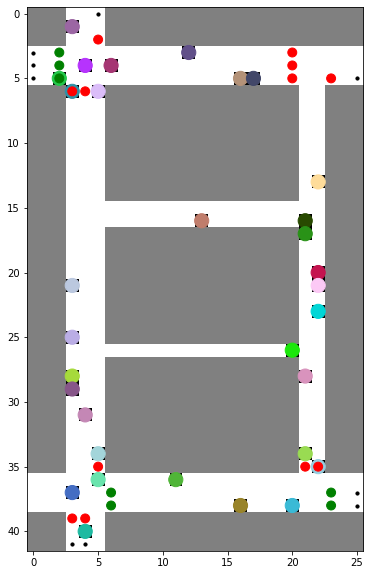

In [114]:
traffic_lights = [
    TrafficLight((35, 21),
                 time_open=20,
                 time_closed=5,
                 status=0,
                 open_alone=False),
    TrafficLight((35, 22),
                 time_open=30,
                 time_closed=30,
                 status=0),
    TrafficLight((37, 23),
                 time_open=20,
                 time_closed=60,
                 status=1),
    TrafficLight((38, 23),
                 time_open=20,
                 time_closed=60,
                 status=1,
                 trigger_idx=[0]),
    
    
    TrafficLight((37, 6),
                 time_open=25,
                 time_closed=45,
                 status=1),
    TrafficLight((38, 6),
                 time_open=25,
                 time_closed=45,
                 status=1,
                 trigger_idx=[6,7,8]),
    TrafficLight((35, 5),
                 time_open=30,
                 time_closed=35,
                 status=0,
                 open_alone=False),
    TrafficLight((39, 3),
                 time_open=30,
                 time_closed=35,
                 status=0,
                 open_alone=False),
    TrafficLight((39, 4),
                 time_open=30,
                 time_closed=35,
                 status=0,
                 open_alone=False),

    TrafficLight((3, 2),
                 time_open=45,
                 time_closed=45,
                 status=1),
    TrafficLight((4, 2),
                 time_open=45,
                 time_closed=45,
                 status=1),
    TrafficLight((5, 2),
                 time_open=45,
                 time_closed=45,
                 status=1),
    TrafficLight((2, 5),
                 time_open=45,
                 time_closed=45,
                 status=0),
    TrafficLight((6, 3),
                 time_open=45,
                 time_closed=45,
                 status=0),
    TrafficLight((6, 4),
                 time_open=45,
                 time_closed=45,
                 status=0),
    
    
    TrafficLight((5, 20),
                 time_open=50,
                 time_closed=10,
                 status=0),
    TrafficLight((4, 20),
                 time_open=50,
                 time_closed=10,
                 status=0),
    TrafficLight((3, 20),
                 time_open=50,
                 time_closed=10,
                 status=0),
    TrafficLight((5, 23),
                 time_open=50,
                 time_closed=10,
                 status=0),
]

spawn_locations = [
    Spawn((0, 5), 9/60),
    
    Spawn((3, 0), 7/60),
    Spawn((4, 0), 7/60),
    Spawn((5, 0), 7/60),
    
    Spawn((5, 25), 8/60),
    
    Spawn((41, 3), 10/60),
    Spawn((41, 4), 10/60),
    
    Spawn((37, 25), 5/60),
    Spawn((38, 25), 5/60),
]

# spawn_locations = [
#     Spawn((0, 5), 0.001),
    
#     Spawn((3, 0), 0.001),
#     Spawn((4, 0), 0.001),
#     Spawn((5, 0), 0.001),
    
#     Spawn((5, 25), 0.001),
    
#     Spawn((41, 3), 0.001),
#     Spawn((41, 4), 0.001),
    
#     Spawn((37, 25), 0.001),
#     Spawn((38, 25), 0.001),
# ]

sim = TrafficSimulation(direction_map,
                        spawn_locations=spawn_locations,
                        traffic_lights=traffic_lights,
                       initial_density = 0.1)
sim.display()

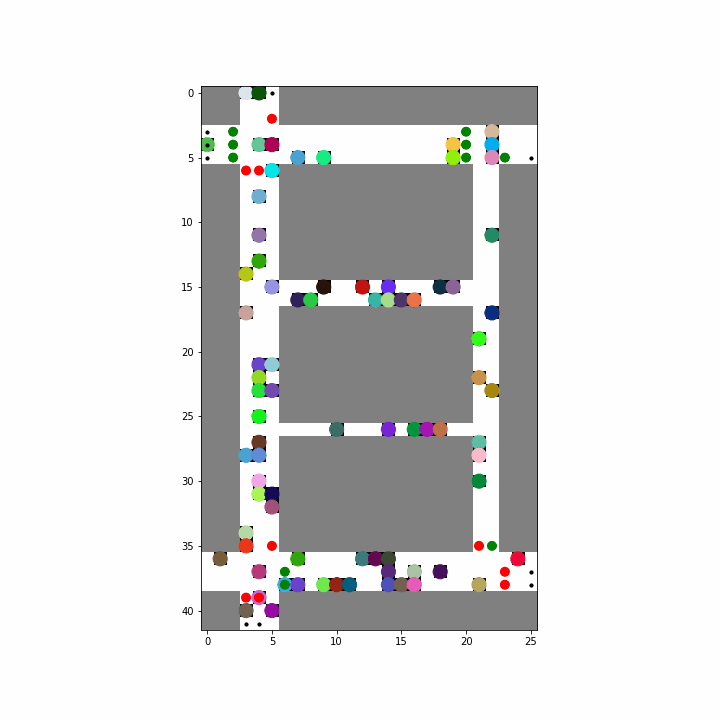

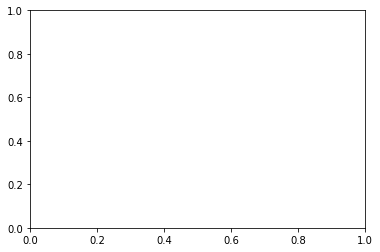

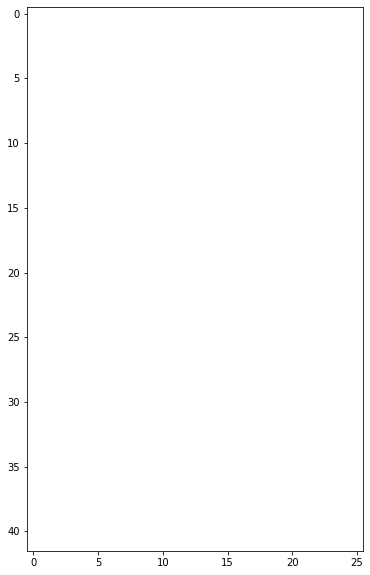

In [119]:
plt.cla()
sim = TrafficSimulation(direction_map,
                        spawn_locations=spawn_locations,
                        traffic_lights=traffic_lights,
                        initial_density=0.2,
                        max_speed = 2)

camera = Camera(sim.fig)

# Update the simulation
for i in range(200):
    sim.display()
    sim.update()
    
    camera.snap()
#sim.display()
anim = camera.animate(interval=100, repeat=True, repeat_delay=500)
anim.save("car_map.gif", writer="pillow")
Image("car_map.gif")

## Empirical Testing

In [90]:
import copy
def experiment(spawn_locations, traffic_lights, trials = 20, steps = 200):
    """
    Runs a traffic simulation multiple times and keeps track of the average traffic flow
    """
    densities = np.linspace(0, 1, 20)
    average_flows = [] 
    for density in densities:
        flows = []
        for trial in range(trials):
            # Create a copy of the Spawns and the traffic lights
            copy_spawn_locations = copy.deepcopy(spawn_locations)
            copy_traffic_lights = copy.deepcopy(traffic_lights)
            # Initialize the simulation
            sim = TrafficSimulation(direction_map,
                                    spawn_locations=copy_spawn_locations,
                                    traffic_lights=copy_traffic_lights,
                                    plot = False,
                                   initial_density = density,
                                   max_speed = 2)
            # Run until reaching an equilibrium state
            for step in range(steps):
                sim.update()
            # Record the final average traffic flow
            flows.append(np.mean(sim.average_traffic_flow[-1]))
        average_flows.append(flows)
    average_flows = np.array(average_flows)
    return average_flows

In [91]:
spawn_locations = [
            Spawn((0, 5), 9/60),

            Spawn((3, 0), 7/60),
            Spawn((4, 0), 7/60),
            Spawn((5, 0), 7/60),

            Spawn((5, 25), 8/60),

            Spawn((41, 3), 10/60),
            Spawn((41, 4), 10/60),

            Spawn((37, 25), 5/60),
            Spawn((38, 25), 5/60),
        ]
average_flows = experiment(spawn_locations, traffic_lights, trials = 10, steps = 50)

In [93]:
improved_spawn_locations = [
    Spawn((0, 5), 9 / 60),
    Spawn((3, 0), 7 / 60),
    Spawn((4, 0), 7 / 60),
    Spawn((5, 0), 7 / 60),
    Spawn((5, 25), 8 / 60),
    Spawn((41, 3), 10 / 60),
    Spawn((41, 4), 10 / 60),
    Spawn((37, 25), 5 / 60),
    Spawn((38, 25), 5 / 60),
]

# Improved traffic lights
# Longer open time for north-south direction in the system 1.
# Better timing between systems 3 and 4
improved_traffic_lights = [
    TrafficLight((35, 21),
                 time_open=20,
                 time_closed=60,
                 status=1,
                 open_alone=False),
    TrafficLight((35, 22), time_open=30, time_closed=30, status=1),
    TrafficLight((37, 23), time_open=20, time_closed=60, status=0),
    TrafficLight((38, 23),
                 time_open=20,
                 time_closed=60,
                 status=0,
                 trigger_idx=[0]),
    TrafficLight((37, 6),
                 time_open=30,
                 time_closed=50,
                 status=1,
                 last_change=12),
    TrafficLight((38, 6),
                 time_open=30,
                 time_closed=50,
                 status=1,
                 last_change=12,
                 trigger_idx=[6, 7, 8]),
    TrafficLight((35, 5),
                 time_open=30,
                 time_closed=35,
                 status=0,
                 open_alone=False),
    TrafficLight((39, 3),
                 time_open=30,
                 time_closed=35,
                 status=0,
                 open_alone=False),
    TrafficLight((39, 4),
                 time_open=30,
                 time_closed=35,
                 status=0,
                 open_alone=False),
    TrafficLight((3, 2), time_open=30, time_closed=60, status=1),
    TrafficLight((4, 2), time_open=30, time_closed=60, status=1),
    TrafficLight((5, 2), time_open=30, time_closed=60, status=1),
    TrafficLight((2, 5), time_open=60, time_closed=30, status=0),
    TrafficLight((6, 3), time_open=60, time_closed=30, status=0),
    TrafficLight((6, 4), time_open=60, time_closed=30, status=0),
    TrafficLight((5, 20), time_open=50, time_closed=10, status=0),
    TrafficLight((4, 20), time_open=50, time_closed=10, status=0),
    TrafficLight((3, 20), time_open=50, time_closed=10, status=0),
    TrafficLight((5, 23), time_open=50, time_closed=10, status=0),
]

improved_average_flows = experiment(improved_spawn_locations,
                                    improved_traffic_lights)

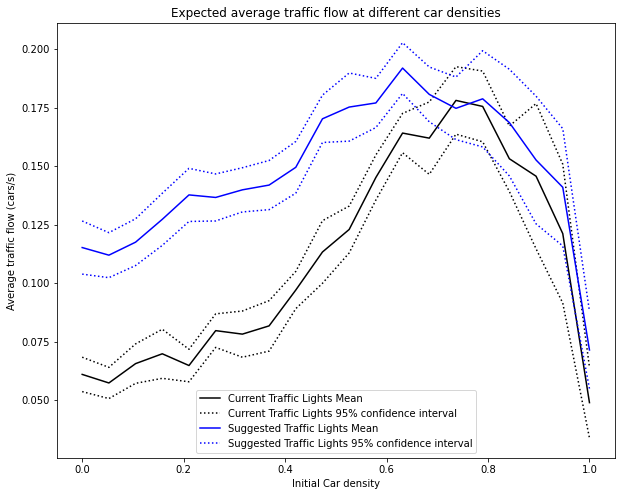

In [100]:
# Plots the average traffic flow for the current and improved traffic light rules. 
plt.figure(figsize=(10, 8))
plt.title('Expected average traffic flow at different car densities')
plt.xlabel('Initial Car density')
plt.ylabel('Average traffic flow (cars/s)')
flow_mean = np.mean(average_flows, axis=1)
std_err = sts.sem(average_flows, axis=1)
improved_flow_mean = np.mean(improved_average_flows, axis=1)
improved_std_err = sts.sem(improved_average_flows, axis=1)
plt.plot(densities, flow_mean, 'k-', label='Current Traffic Lights Mean')
plt.plot(densities, flow_mean - 1.96 * std_err, 'k:',
         label='Current Traffic Lights 95% confidence interval')
plt.plot(densities, flow_mean + 1.96 * std_err, 'k:')
plt.plot(densities, improved_flow_mean, 'b-', label='Suggested Traffic Lights Mean')
plt.plot(densities, improved_flow_mean - 1.96 * improved_std_err, 'b:',
         label='Suggested Traffic Lights 95% confidence interval')
plt.plot(densities, improved_flow_mean + 1.96 * improved_std_err, 'b:')
plt.legend()
plt.show()

In [98]:
print(improved_flow_mean[0]-flow_mean[0])
print(flow_mean[0])

0.05420054200542003
0.060975609756097573


## OTHER MAPS

In [ ]:
car_map = np.array([[0,0,0,0,0,-1,0,0],
                    [-1,-1,-1,-1,-1,-1,-1,-1]])
direction_map = np.array([[None, None, None, None, None, [(-1,0)], None, None],
                         [[(0,1)], [(0,1)], [(0,1)], [(0,1)], [(0,1)], [(-1,0), (0,1)], [(0,1)], [(0,1)]]])
spawn_locations = [Spawn((1,0), 1)]
traffic_lights = [TrafficLight((1,4), time_open = 5, time_closed = 5), TrafficLight((1,2), time_open = 3, time_closed = 3)]

C:\Users\rober\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  import sys


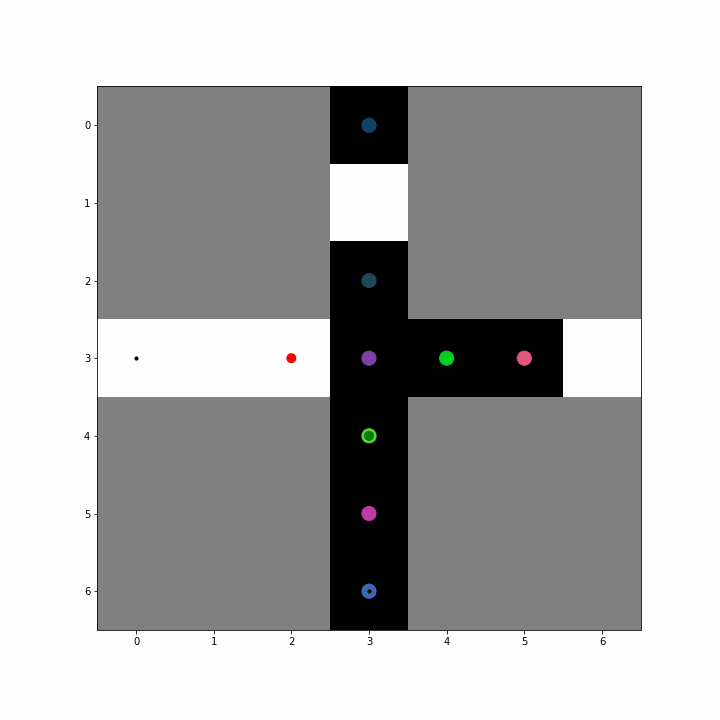

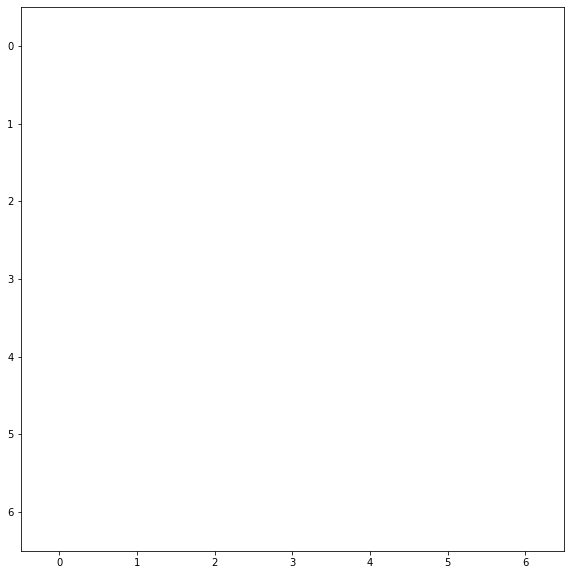

In [5]:
direction_map = np.array([[None, None, None, [(-1, 0)], None, None, None],
                          [None, None, None, [(-1, 0)], None, None, None],
                          [None, None, None, [(-1, 0)], None, None, None],
                          [[(0, 1)], [(0, 1)], [(0, 1)], [(-1, 0), (0, 1)],[(0, 1)], [(0, 1)], [(0, 1)]],
                          [None, None, None, [(-1, 0)], None, None, None],
                          [None, None, None, [(-1, 0)], None, None, None],
                          [None, None, None, [(-1, 0)], None, None, None]])
spawn_locations = [Spawn((3, 0), .5), Spawn((6, 3), .5)]
traffic_lights = [
    TrafficLight((3, 2), time_open=5, time_closed=10, status = 0, open_alone = False),
    TrafficLight((4, 3), time_open=5, time_closed=10, status = 1, trigger_idx = [0])
]
sim = TrafficSimulation(direction_map,
                        spawn_locations=spawn_locations,
                        traffic_lights=traffic_lights,
                        initial_density=0.5,
                       max_speed = 3)

camera = Camera(sim.fig)

for i in range(50):
    sim.display()
    sim.update()
    #print(sim.wall_map)
    camera.snap()

anim = camera.animate(interval=300, repeat=True, repeat_delay=500)
anim.save("car_map.gif", writer="pillow")
Image("car_map.gif")